##### Copyright 2023 The MediaPipe Authors. All Rights Reserved.

In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Hand Landmarks Detection with MediaPipe Tasks

This notebook shows you how to use MediaPipe Tasks Python API to detect hand landmarks from images.

## Preparation

Let's start with installing MediaPipe.

In [1]:
!pip install -q mediapipe

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.7/35.7 MB 32.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 28.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-metadata 1.15.0 requires protobuf<4.21,>=3.20.3; python_version < "3.11", but you have protobuf 4.25.3 which is incompatible.


Then download an off-the-shelf model bundle. Check out the [MediaPipe documentation](https://developers.google.com/mediapipe/solutions/vision/hand_landmarker#models) for more information about this model bundle.

In [2]:
!wget -q https://storage.googleapis.com/mediapipe-models/hand_landmarker/hand_landmarker/float16/1/hand_landmarker.task

## Visualization utilities

In [3]:
#@markdown We implemented some functions to visualize the hand landmark detection results. <br/> Run the following cell to activate the functions.

from mediapipe import solutions
from mediapipe.framework.formats import landmark_pb2
import numpy as np

MARGIN = 10  # pixels
FONT_SIZE = 1
FONT_THICKNESS = 1
HANDEDNESS_TEXT_COLOR = (88, 205, 54) # vibrant green

def draw_landmarks_on_image(rgb_image, detection_result):
  hand_landmarks_list = detection_result.hand_landmarks
  handedness_list = detection_result.handedness
  annotated_image = np.copy(rgb_image)

  # Loop through the detected hands to visualize.
  for idx in range(len(hand_landmarks_list)):
    hand_landmarks = hand_landmarks_list[idx]
    handedness = handedness_list[idx]

    # Draw the hand landmarks.
    hand_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
    hand_landmarks_proto.landmark.extend([
      landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in hand_landmarks
    ])
    solutions.drawing_utils.draw_landmarks(
      annotated_image,
      hand_landmarks_proto,
      solutions.hands.HAND_CONNECTIONS,
      solutions.drawing_styles.get_default_hand_landmarks_style(),
      solutions.drawing_styles.get_default_hand_connections_style())

    # Get the top left corner of the detected hand's bounding box.
    height, width, _ = annotated_image.shape
    x_coordinates = [landmark.x for landmark in hand_landmarks]
    y_coordinates = [landmark.y for landmark in hand_landmarks]
    text_x = int(min(x_coordinates) * width)
    text_y = int(min(y_coordinates) * height) - MARGIN

    # Draw handedness (left or right hand) on the image.
    cv2.putText(annotated_image, f"{handedness[0].category_name}",
                (text_x, text_y), cv2.FONT_HERSHEY_DUPLEX,
                FONT_SIZE, HANDEDNESS_TEXT_COLOR, FONT_THICKNESS, cv2.LINE_AA)

  return annotated_image

## Download test image

Let's grab a test image that we'll use later. The image is from [Unsplash](https://unsplash.com/photos/mt2fyrdXxzk).

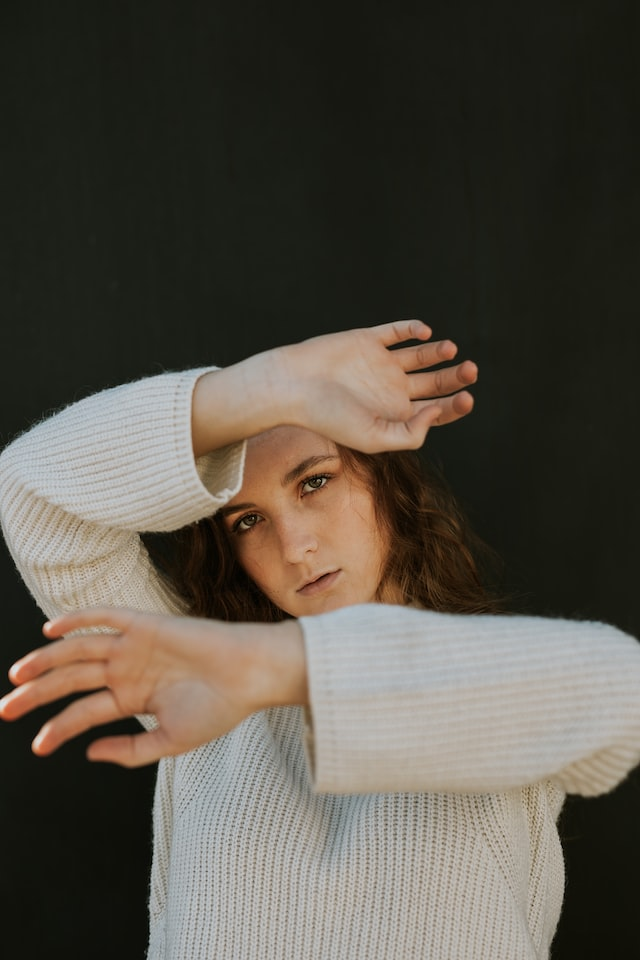

In [4]:
!wget -q -O image.jpg https://storage.googleapis.com/mediapipe-tasks/hand_landmarker/woman_hands.jpg

import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread("image.jpg")
cv2_imshow(img)

Optionally, you can upload your own image. If you want to do so, uncomment and run the cell below.

## Running inference and visualizing the results

Here are the steps to run hand landmark detection using MediaPipe.

Check out the [MediaPipe documentation](https://developers.google.com/mediapipe/solutions/vision/hand_landmarker/python) to learn more about configuration options that this solution supports.


Filename:  0.jpg
Image path:  a/0.jpg
Saved annotated image to annotated_images/a/0.jpg


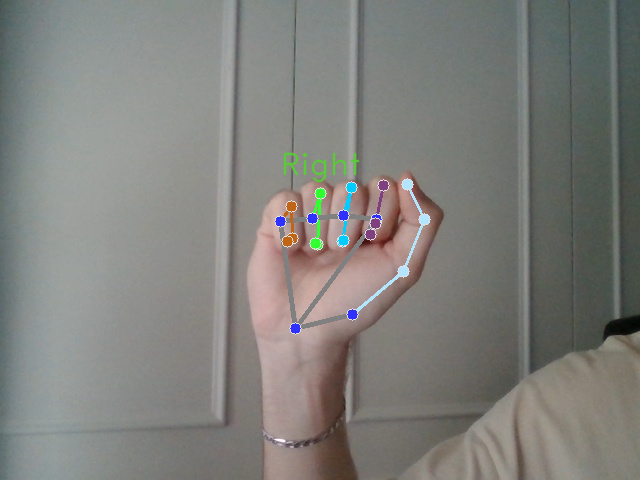

Filename:  1.jpg
Image path:  a/1.jpg
Saved annotated image to annotated_images/a/1.jpg


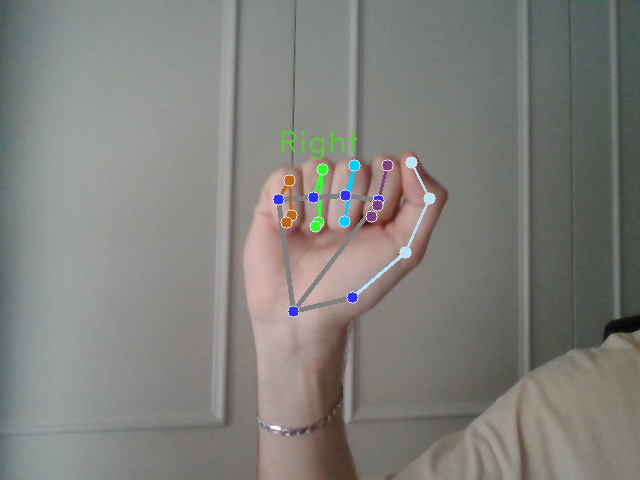

Filename:  2.jpg
Image path:  a/2.jpg
Saved annotated image to annotated_images/a/2.jpg


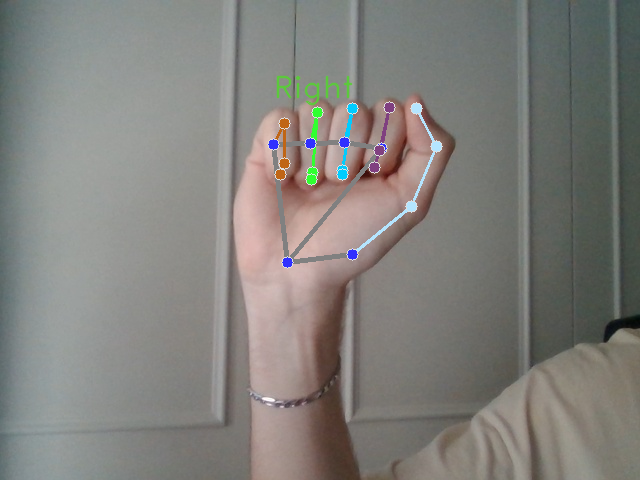

Filename:  3.jpg
Image path:  a/3.jpg
Saved annotated image to annotated_images/a/3.jpg


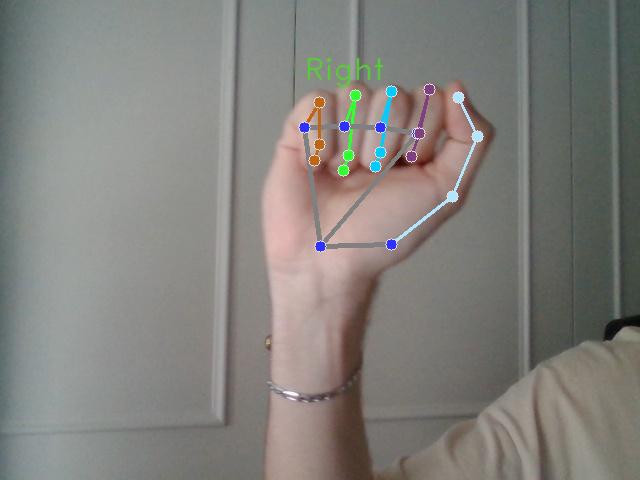

Filename:  4.jpg
Image path:  a/4.jpg
Saved annotated image to annotated_images/a/4.jpg


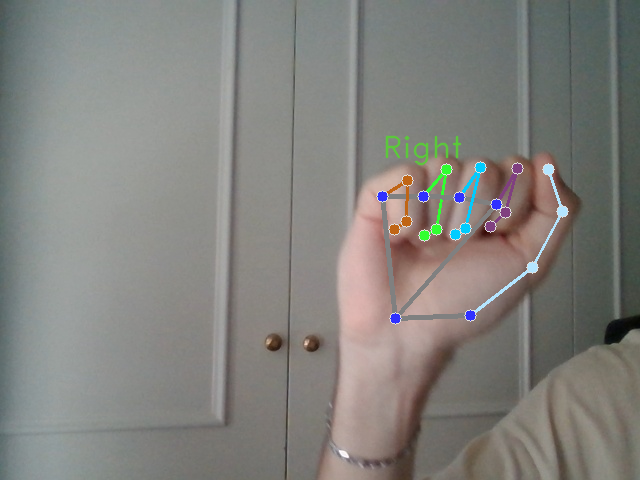

Filename:  5.jpg
Image path:  a/5.jpg
Saved annotated image to annotated_images/a/5.jpg


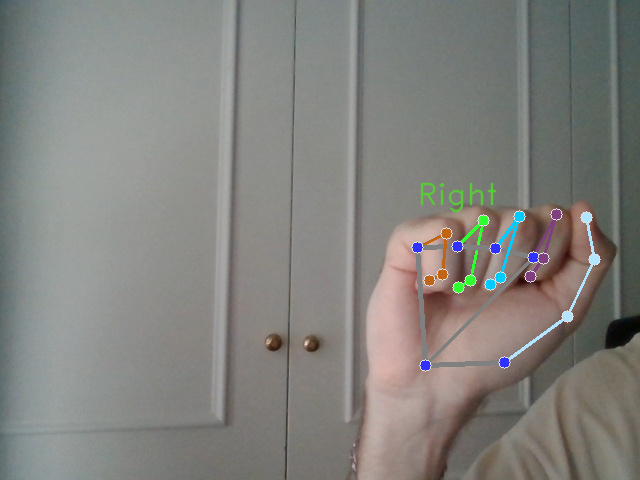

Filename:  6.jpg
Image path:  a/6.jpg
Saved annotated image to annotated_images/a/6.jpg


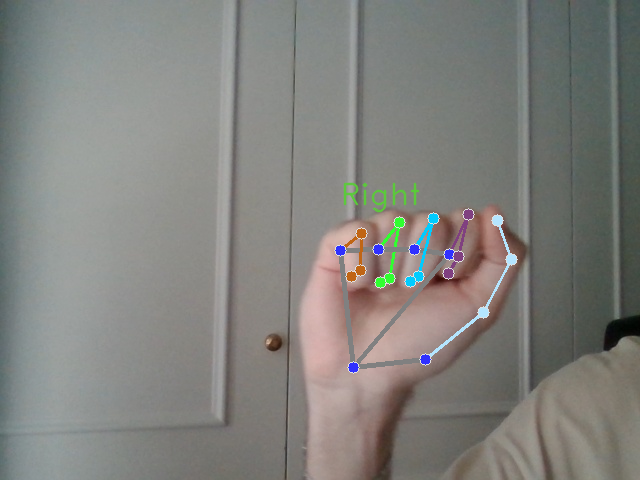

Filename:  7.jpg
Image path:  a/7.jpg
Saved annotated image to annotated_images/a/7.jpg


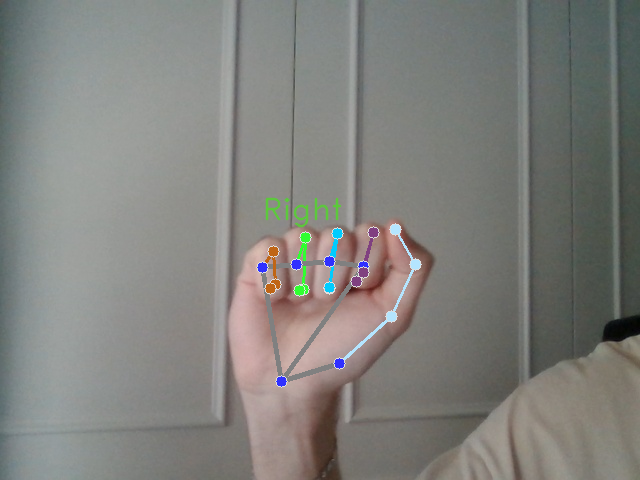

Filename:  8.jpg
Image path:  a/8.jpg
Saved annotated image to annotated_images/a/8.jpg


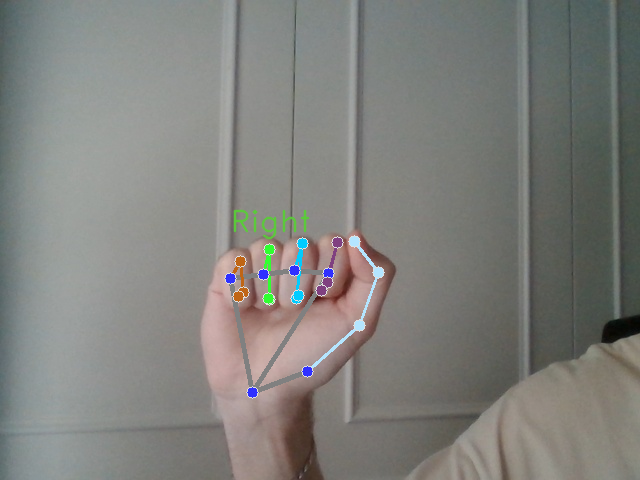

Filename:  9.jpg
Image path:  a/9.jpg
Saved annotated image to annotated_images/a/9.jpg


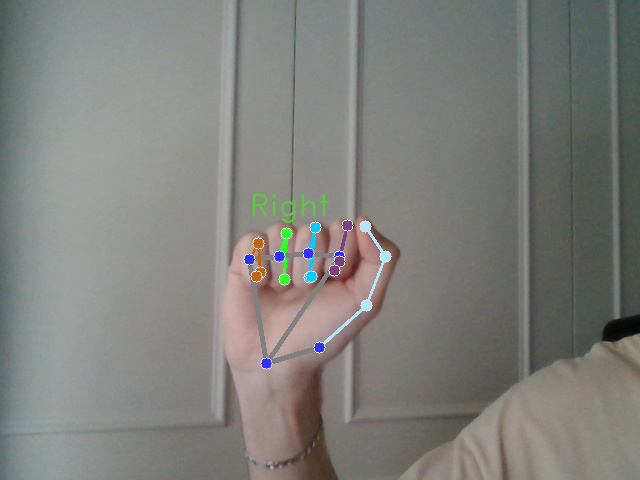

Filename:  0.jpg
Image path:  b/0.jpg
Saved annotated image to annotated_images/b/0.jpg


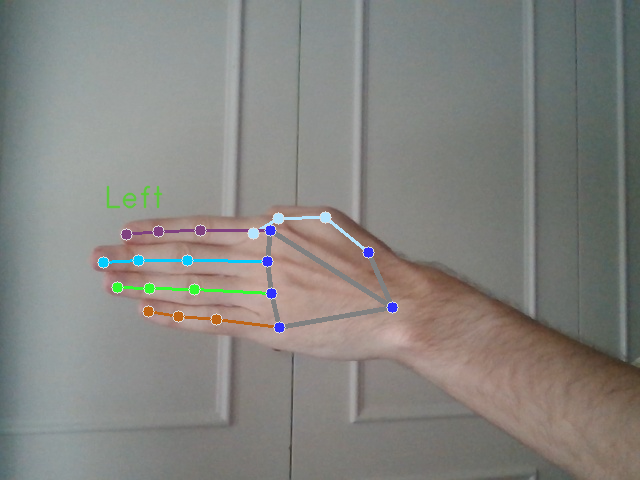

Filename:  1.jpg
Image path:  b/1.jpg
Saved annotated image to annotated_images/b/1.jpg


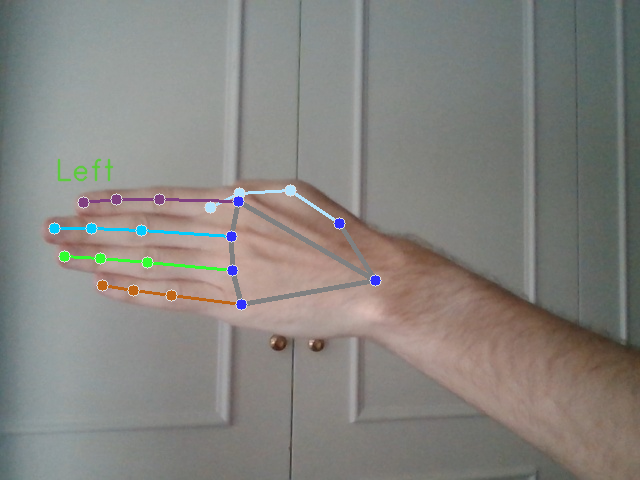

Filename:  2.jpg
Image path:  b/2.jpg
Saved annotated image to annotated_images/b/2.jpg


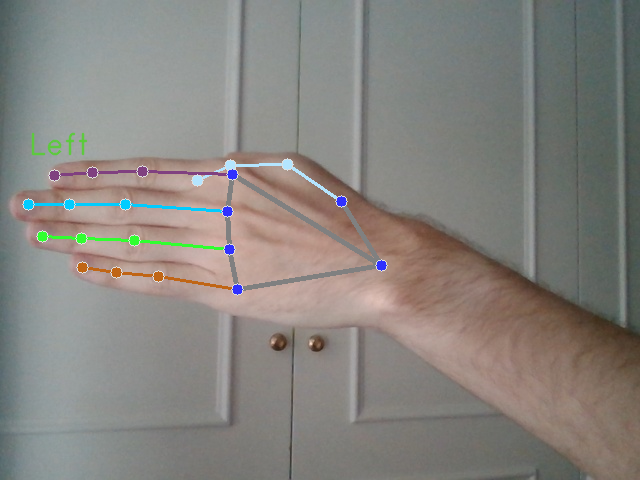

Filename:  3.jpg
Image path:  b/3.jpg
Saved annotated image to annotated_images/b/3.jpg


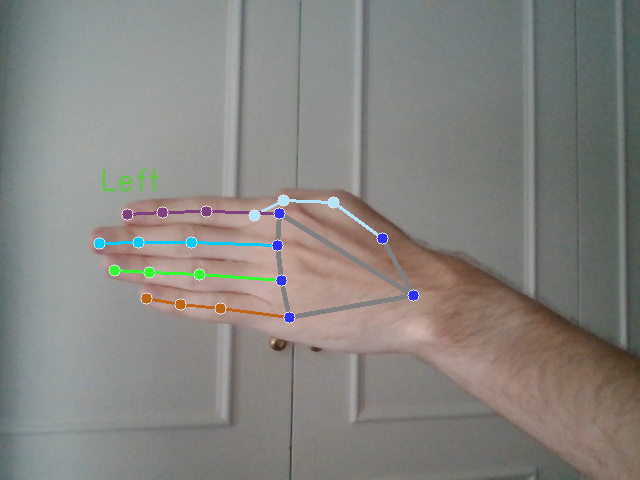

Filename:  4.jpg
Image path:  b/4.jpg
Saved annotated image to annotated_images/b/4.jpg


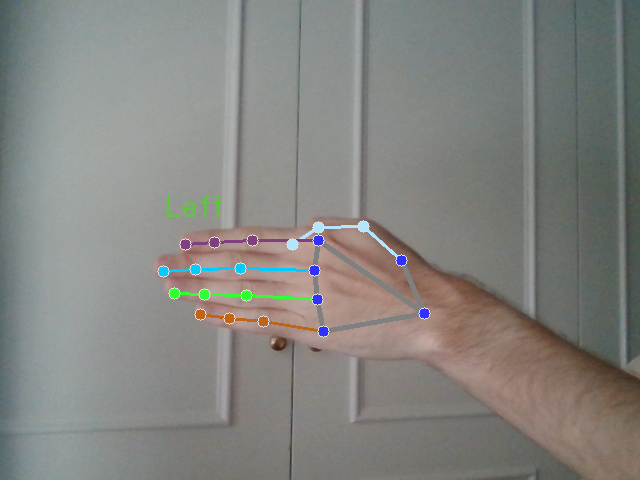

Filename:  5.jpg
Image path:  b/5.jpg
Saved annotated image to annotated_images/b/5.jpg


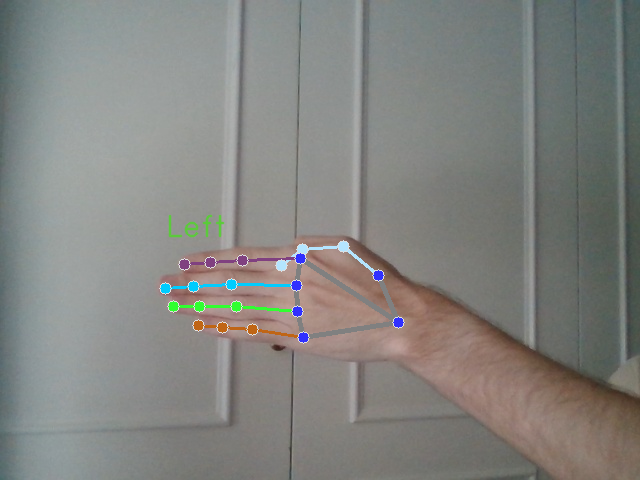

Filename:  6.jpg
Image path:  b/6.jpg
Saved annotated image to annotated_images/b/6.jpg


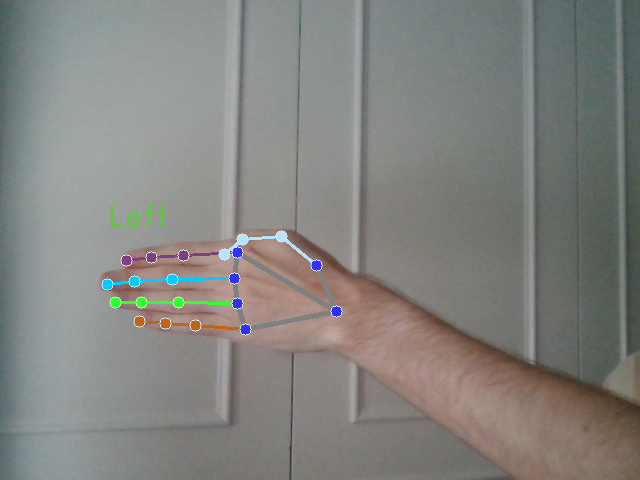

Filename:  7.jpg
Image path:  b/7.jpg
Saved annotated image to annotated_images/b/7.jpg


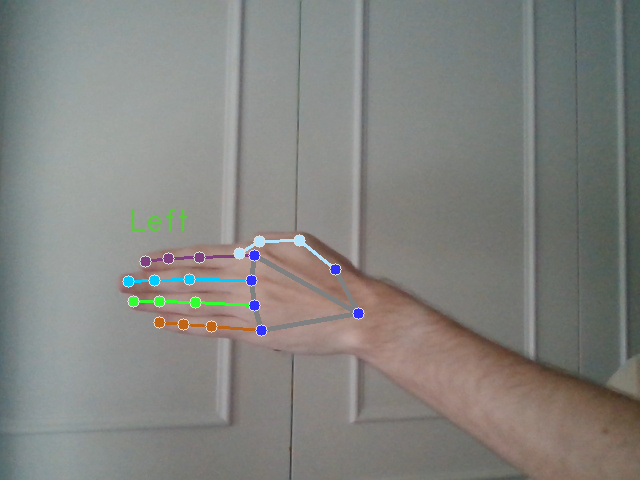

Filename:  8.jpg
Image path:  b/8.jpg
Saved annotated image to annotated_images/b/8.jpg


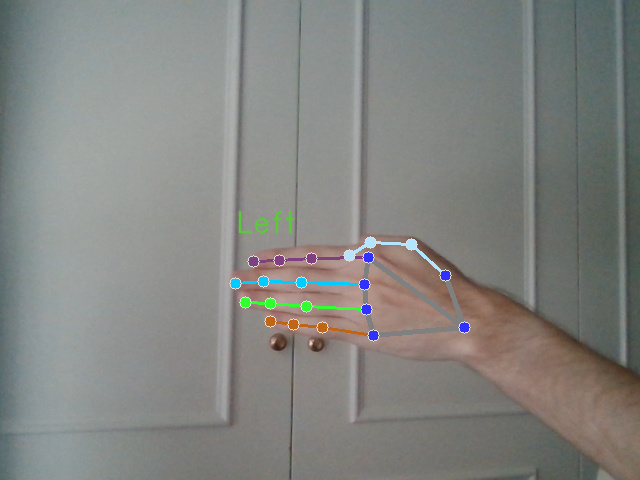

Filename:  9.jpg
Image path:  b/9.jpg
Saved annotated image to annotated_images/b/9.jpg


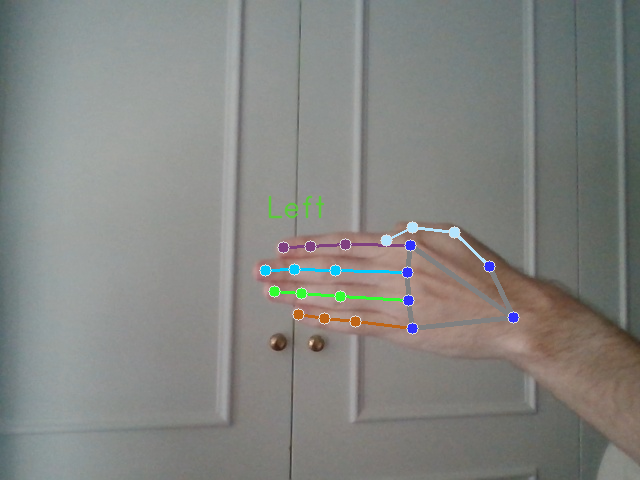

Filename:  0.jpg
Image path:  c/0.jpg
Saved annotated image to annotated_images/c/0.jpg


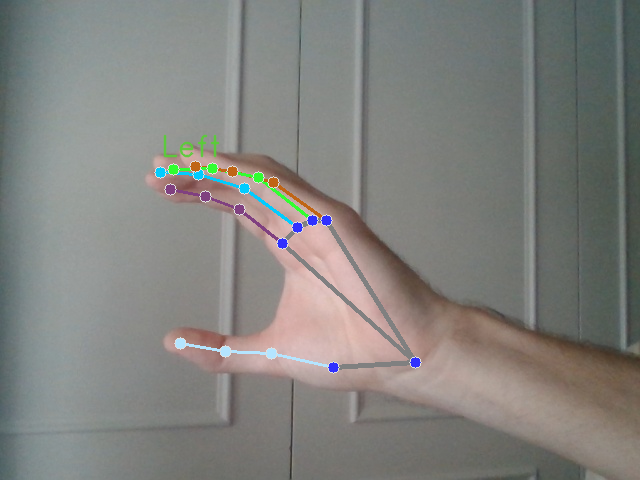

Filename:  1.jpg
Image path:  c/1.jpg
Saved annotated image to annotated_images/c/1.jpg


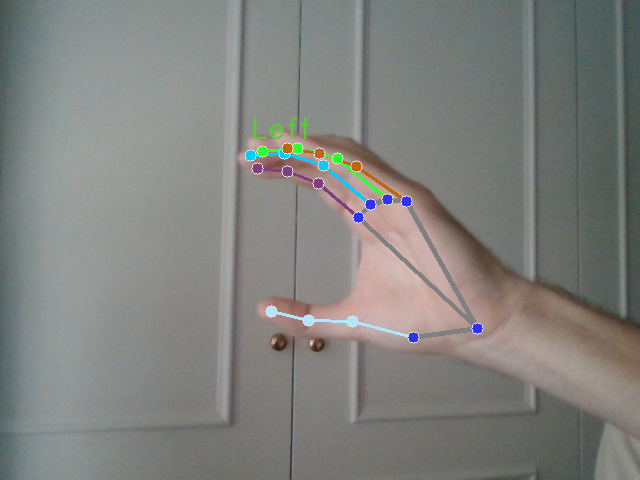

Filename:  2.jpg
Image path:  c/2.jpg
Saved annotated image to annotated_images/c/2.jpg


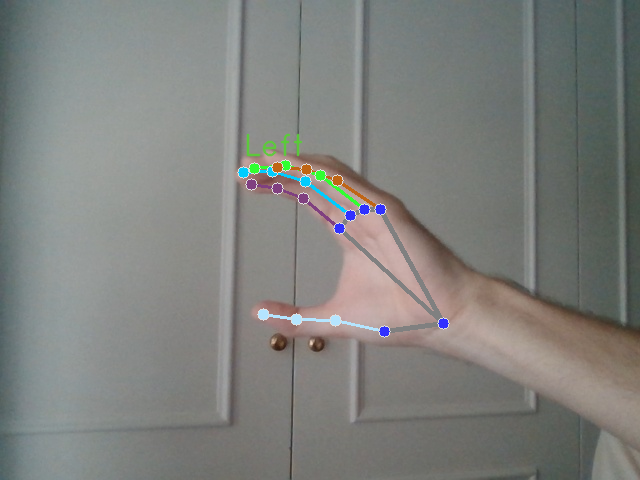

Filename:  3.jpg
Image path:  c/3.jpg
Saved annotated image to annotated_images/c/3.jpg


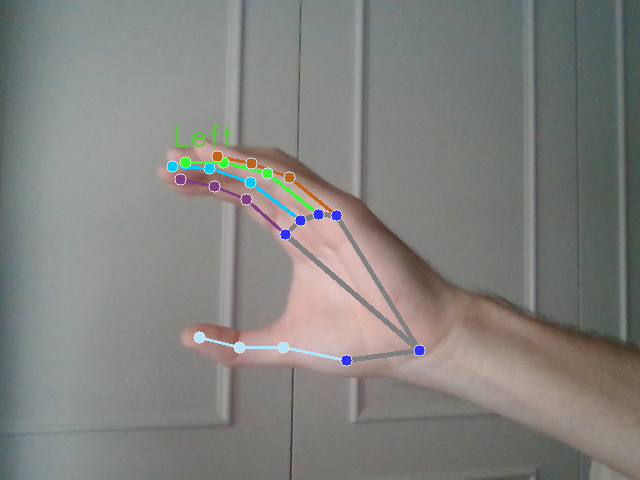

Filename:  4.jpg
Image path:  c/4.jpg
Saved annotated image to annotated_images/c/4.jpg


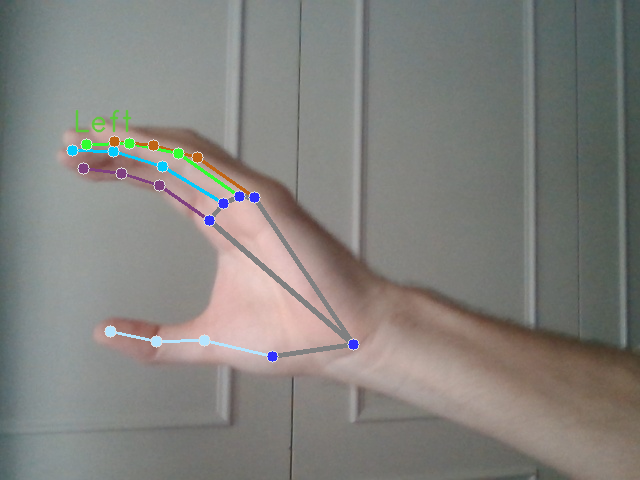

Filename:  5.jpg
Image path:  c/5.jpg
Saved annotated image to annotated_images/c/5.jpg


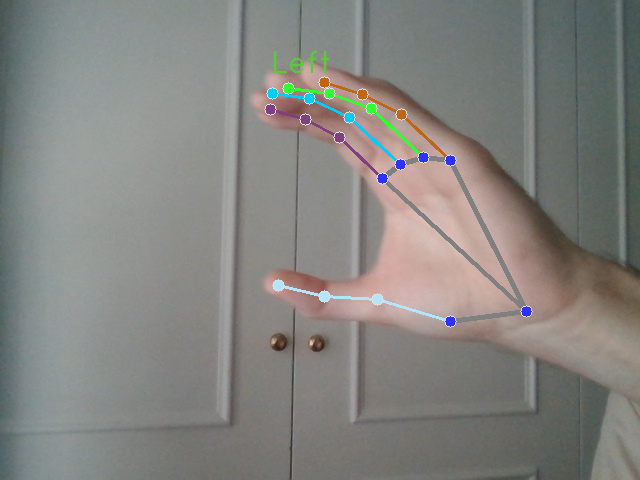

Filename:  6.jpg
Image path:  c/6.jpg
Saved annotated image to annotated_images/c/6.jpg


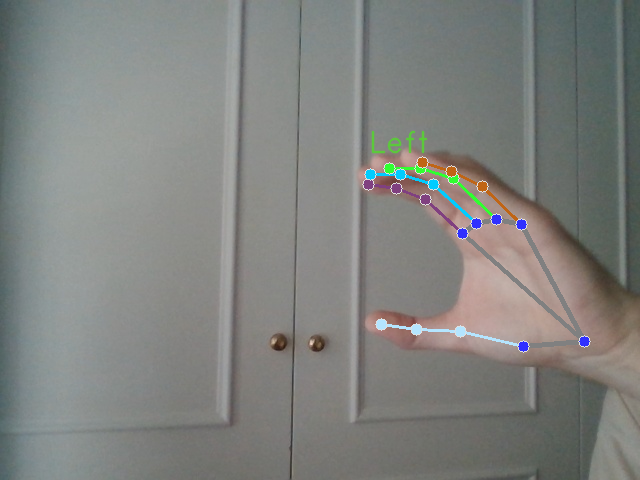

Filename:  7.jpg
Image path:  c/7.jpg
Saved annotated image to annotated_images/c/7.jpg


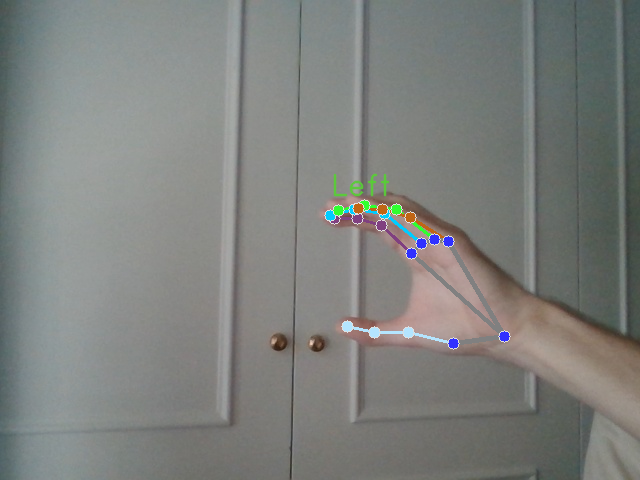

Filename:  8.jpg
Image path:  c/8.jpg
Saved annotated image to annotated_images/c/8.jpg


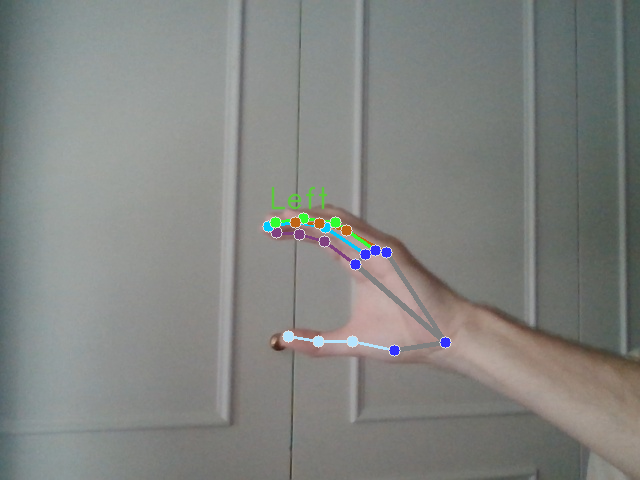

Filename:  9.jpg
Image path:  c/9.jpg
Saved annotated image to annotated_images/c/9.jpg


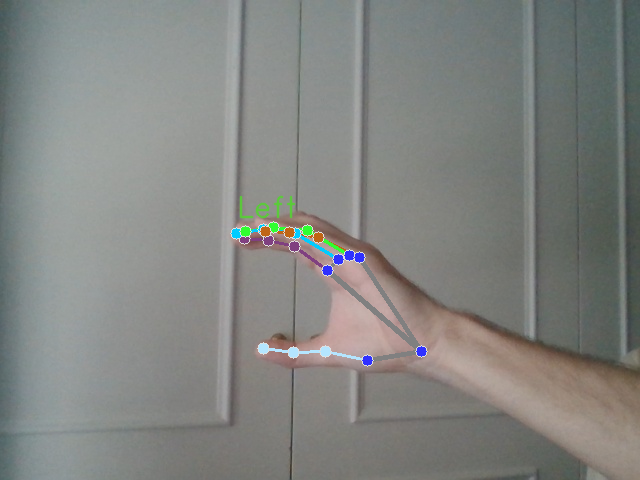

In [25]:
# STEP 1: Import the necessary modules.
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
import os
import cv2

# STEP 2: Create an HandLandmarker object.
base_options = python.BaseOptions(model_asset_path='hand_landmarker.task')
options = vision.HandLandmarkerOptions(base_options=base_options,
                                       num_hands=1)
detector = vision.HandLandmarker.create_from_options(options)

folder_path = ["a","b","c"]
output_parent_folder = "annotated_images"

for folder_path in folder_path:
  output_folder = os.path.join(output_parent_folder, folder_path)

  # Crear la carpeta de salida si no existe.
  os.makedirs(output_folder, exist_ok=True)

  # Obtener y ordenar los nombres de los archivos numéricamente.
  file_list = sorted([f for f in os.listdir(folder_path) if f.endswith(".jpg")], key=lambda x: int(os.path.splitext(x)[0]))
  for filename in file_list:
    print("Filename: ", filename)
    image_path = os.path.join(folder_path, filename)

    # STEP 3: Load the input image.
    print("Image path: ", image_path)
    image = mp.Image.create_from_file(image_path)

    # STEP 4: Detect hand landmarks from the input image.
    detection_result = detector.detect(image)

    # STEP 5: Process the classification result. In this case, visualize it.
    annotated_image = draw_landmarks_on_image(image.numpy_view(), detection_result)

    # Guardar la imagen anotada en la carpeta de salida.
    output_path = os.path.join(output_folder, filename)
    cv2.imwrite(output_path, cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR))
    print(f"Saved annotated image to {output_path}")


    cv2_imshow(cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR))